# Introduction

This is a basic pseudo-code outline for how to perform basic reduction and calibration on HRPO data. You will need to write the code and reduction processes using CCDproc and the other appropriate packages.

# Code outline

1. Import necessary packages
2. Gather all data
3. Prepare for reduction
    - Make master bias
    - Make master dark
    - Make master flat(s)
4. Reduce the data
    - Use ccd_process to perform reduction and calibration
    - Optional: Plate solve images
    - Write out calibrated and solved data to a different directory, or with a different name
---

### Name: 
0. Rename this notebook so that it has your name in it and put your name in the comment above.
1. Import all of the necessary packages:
    - os
    - sys
    - numpy
    - ccdproc
    - astropy.units
    - aperturePhot.show_image
    

In [16]:
# all imports
import os
import sys
import numpy as np
import ccdproc as ccdp
import astropy.units as u
sys.path.append('/home/idies/workspace/Storage/fzohrabi/persistent/hrpo-pipeline')
import aperturePhot as ap
from astropy.nddata import CCDData

2. Gather all data

Define a string to store the path to the data directory you are working in.
Use *os.path.join* to merge together the string "/home/idies/workspace/" with the data directory path string.

Use *os.chdir* to move into the data directory. This will let us use relative paths instead of absolute.

`
base = "/home/idies/workspace/"
data_dir = ""

path = os.path.join(...)
os.chdir(path)
`

Use the conditional *os.path.exists* to check if there is a directory called "reduced" in the current directory. If there isn't, then make it with os.mkdir

In python you can check a condition with an if statement such as:

`
if condition:
     do something
`
Use *ccdp.ImageFileCollection* on the current directory to get a list of of all the images in the current directory as strings. I refer to this complete collection as *images*
`
images = ccdp.ImageFileCollection(...)
`


In [17]:
base = "/home/idies/workspace/"
data_dir = "Temporary/fzohrabi/scratch/20200909"
path = os.path.join(base, data_dir)

os.chdir(path)
if os.path.exists("reduced") == False:
    os.mkdir("reduced")
images = ccdp.ImageFileCollection(path)
images.summary

file,simple,bitpix,naxis,naxis1,naxis2,bscale,bzero,date-obs,exptime,exposure,set-temp,ccd-temp,xpixsz,ypixsz,xbinning,ybinning,xorgsubf,yorgsubf,readoutm,filter,imagetyp,focuspos,focustem,object,objctra,objctdec,objctalt,objctaz,objctha,sitelat,sitelong,jd,jd-helio,airmass,focallen,aptdia,aptarea,swcreate,sbstdver,telescop,instrume,observer,notes,flipstat,swowner,tilexy
str19,bool,int64,int64,int64,int64,float64,float64,str19,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,str10,object,str11,int64,float64,str10,str8,str9,str8,str8,str8,str8,str9,float64,float64,float64,float64,float64,float64,str34,str21,str1,str14,str1,str1,str1,str23,object
61-Cyg-001B.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:52:14,0.2,0.2,-20.0,-20.189094750000002,13.0,13.0,1,1,0,0,Monochrome,Bessel B,Light Frame,7256,626.0,61-Cyg,21 06 54,+38 45 05,74.8283,51.8635,-1.0215,30 20 45,-91 04 13,2459102.6196064814,2459102.6231345567,1.0360168016113926,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
61-Cyg-001R.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:51:52,0.2,0.2,-20.0,-20.283392250000002,13.0,13.0,1,1,0,0,Monochrome,Bessel R,Light Frame,7256,626.0,61-Cyg,21 06 54,+38 45 05,74.7660,51.9967,-1.0277,30 20 45,-91 04 13,2459102.6193518518,2459102.6228799303,1.0363228166402796,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
61-Cyg-001V.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:52:04,0.2,0.2,-20.0,-20.189094750000002,13.0,13.0,1,1,0,0,Monochrome,Bessel V,Light Frame,7256,626.0,61-Cyg,21 06 54,+38 45 05,74.7993,51.9258,-1.0244,30 20 45,-91 04 13,2459102.619490741,2459102.6230188175,1.0361556554607056,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
ASASN_20lb-001B.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:24:17,60.0,60.0,-20.0,-20.0853675,13.0,13.0,1,1,0,0,Monochrome,Bessel B,Light Frame,7256,626.0,ASASN_20lb,20 48 29,-06 04 06,49.9599,152.2129,-1.1701,30 20 45,-91 04 13,2459102.600196759,2459102.6052317056,1.306754674428747,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
ASASN_20lb-001R.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:21:54,60.0,60.0,-20.0,-20.176521750000003,13.0,13.0,1,1,0,0,Monochrome,Bessel R,Light Frame,7256,626.0,ASASN_20lb,20 48 29,-06 04 06,49.7197,151.3847,-1.2093,30 20 45,-91 04 13,2459102.5985416668,2459102.6035767063,1.3115025597395136,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
ASASN_20lb-001V.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:23:06,60.0,60.0,-20.0,-20.016216,13.0,13.0,1,1,0,0,Monochrome,Bessel V,Light Frame,7256,626.0,ASASN_20lb,20 48 29,-06 04 06,49.8417,151.8015,-1.1895,30 20 45,-91 04 13,2459102.599375,2459102.6044099927,1.3090887896830665,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,--
ASASN_20lb_001V.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:27:38,60.0,60.0,-20.0,-20.01935925,13.0,13.0,1,1,0,0,Monochrome,Bessel V,Light Frame,7256,626.0,ASASN_20lb,20 48 35,-06 02 36,50.3113,153.3834,-1.1146,30 20 45,-91 04 13,2459102.602523148,2459102.607559455,1.3001426532440181,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.24 140606 2EUKY,SBFITSEXT Version 1.0,,Apogee USB/Net,,,,LSU Physics-Astronomy-1,"0,0"
ASASN_20lb_002V.fit,True,16,2,1024,1024,1.0,32768.0,2020-09-10T02:28:50,60.0,60.0,-20.0,-19.852767,13.0,13.0,1,1,0,0,Monochrome,Bessel V,Light Frame,7256,626.0,ASASN_20lb,20 48 23,-06 02 36,50.4415,153.8719,-1.0919,30 20 45,-91 04 13,2459102.6033564815,2459102.608389755,1.2975888506713302,4115.0,508.0,200656.16730637552,MaxIm DL Version 5.2

3. Reduction Preparation: Make master bias

Use *images.filter* to get only the images with *imagetyp="Bias Frame"*.

Create a master bias frame with *ccdp.combine* on your list of bias frames. Use the median method and specify that *unit="adu"*. I will refer to this master bias frame as *mbias*

Save the master bias with *mbias.write* to "reduced/mbias.fit", flag write to *overwrite=True* in case we rerun this entire script on this same directory multiple times.

`
biases = images.filter( ... )
mbias = ccdp.combine(biases, ... )
mbias.write( ...)
`

787.9781312942505 1.4826
781.0 797.8613292661979


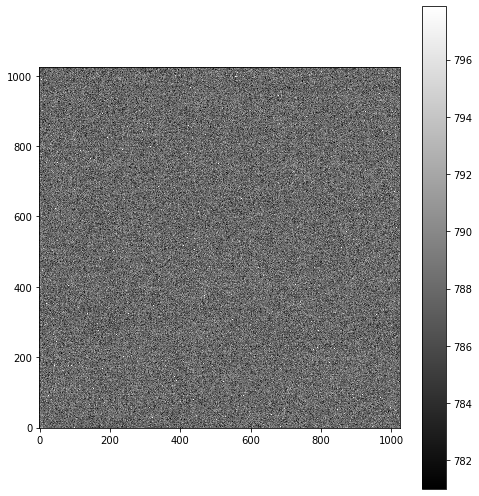

In [19]:
biases = images.files_filtered(imagetyp = "Bias Frame", naxis1=1024)
mbias = ccdp.combine(biases, method='median', unit='adu')

mbias.write("reduced/mbias.fit", overwrite = True)

mbiasimage = CCDData.read("reduced/mbias.fit")
ap.showimage(mbiasimage)

4. Reduction Preparation: Make master dark

Use images.files_filtered to get only the images with imagetyp="Dark Frame". I will refer to this collection as *darks*.

Create two empty lists, one to store the reduced darks and one to store the exposure time of each frame. I will refer to this as *exptimes*

Use a for loop to iterate over *darks.ccds* . Subtract the *mbias* from each image with *ccdp.subtract_bias* and append it to the first empty list, append to the second empty list the exposure time from the header.

```
exptimes = []
red_darks = []
darks = filtered collection


for ccd in darks.ccds():
    ccd = bias subtracted dark
    Append the cleaned ccd to the red_darks list
    Append ccd.header["exptime"] to the exposure time list.
```

After this, convert your exposure times list to a numpy array. 

Create master dark frame with *ccdp.combine*. Use the median method, set *scale=1/exptimes*, and set *unit="adu"*. I will refer to this as *mdark*

Set the "exposure" and "exptime" header keywords in *mdark.header* to 1.

Save *mdark* in the reduced data directory.

```
exptimes = np.array(exptimes)
mdark = ccdp.combine (red_darks, ...)
mdark.header["exptime"] = 1
mdark.header["exposure"] = 1

mdark.write(...)

```

0.18012296358744306 0.06177499999999998
-0.03333333333333333 0.5095500684557996


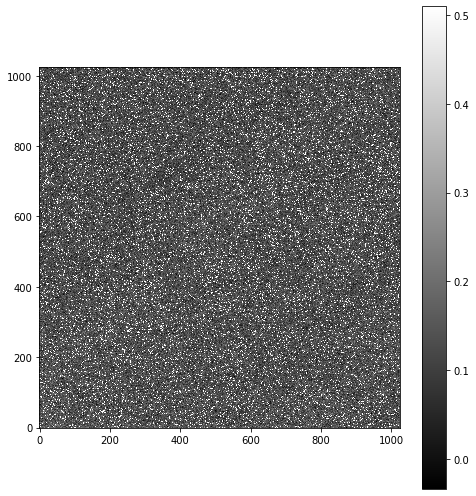

In [20]:

darks = images.filter(imagetyp = "Dark Frame", naxis1=1024)

exptimes = []
red_darks = []

for dark in darks.ccds(ccd_kwargs = {"unit":"adu"}):
    ccd = ccdp.subtract_bias(dark, mbias)
    red_darks.append(ccd)
    exptimes.append(ccd.header["exptime"])
exptimes = np.array(exptimes)
mdark = ccdp.combine (red_darks, method='median', scale=1/exptimes, unit='adu')
mdark.header["exptime"] = 1
mdark.header["exposure"] = 1

mdark.write("reduced/mdark.fit", overwrite = True)

mdarkimage = CCDData.read("reduced/mdark.fit")
ap.showimage(mdarkimage)

5. Reduction Preparation: Make the master flat frames

Flat frames have the added complication that they are specific to each filter. Using nested for loops, we can save from writing the same code multiple times.

Define a list of filter names as strings

Create an empty dictionary to store our master flats for later.

Iterate over the filters in the outer loop.

Use *images.files_filtered* with *imagetyp="Flat Field"* as well as *filter=filt*.

Create empty list to store reduced flats.

Iterate over the flat ccds. Bias subtract, dark subtract with *scale=True, exposure_unit=u.s, exposure_time='exptime'*.

Append reduced flat to *red_flats*.

I present one way to make a unique filename for each filter's flat. There are a variety of things you can do here though.

Use *ccdp.combie* on the reduced flats. Write out the flat to the reduced directory with the filename.

Add a memory copy of the mflat to the dictionary with the key set to the filter name.

```
filters = ["Bessel B", "Bessel V", "Bessel R"]
mflats = {}

for filt in filters:
    flats = files.filter( ... )
    red_flats = []
    
    for flat in flats.ccds():
        flat = bias subtract
        flat = dark subtract, scale=True, exposure_unit=u.s
        Append flat to red_flats
    
    filt_string = filter.replace(" ", "_")
    fname = filt_string+"flat.fit"
    
    mflat = ccdp.combine(red_flats, ...)
    mflat.write(...)
    mflats[filt] = mflat.copy()
```

ImageFileCollection(location='', keywords=['simple', 'bitpix', 'naxis', 'naxis1', 'naxis2', 'bscale', 'bzero', 'date-obs', 'exptime', 'exposure', 'set-temp', 'ccd-temp', 'xpixsz', 'ypixsz', 'xbinning', 'ybinning', 'xorgsubf', 'yorgsubf', 'readoutm', 'filter', 'imagetyp', 'focuspos', 'focustem', 'object', 'objctra', 'objctdec', 'objctalt', 'objctaz', 'objctha', 'sitelat', 'sitelong', 'jd', 'jd-helio', 'airmass', 'focallen', 'aptdia', 'aptarea', 'swcreate', 'sbstdver', 'telescop', 'instrume', 'observer', 'notes', 'flipstat', 'swowner', 'tilexy'], filenames=['/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/DomeFlat-001B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/DomeFlat-002B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/DomeFlat-003B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/DomeFlat-004B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/DomeFlat-005B.fit'])
ImageFileCollection(location='', keywords=

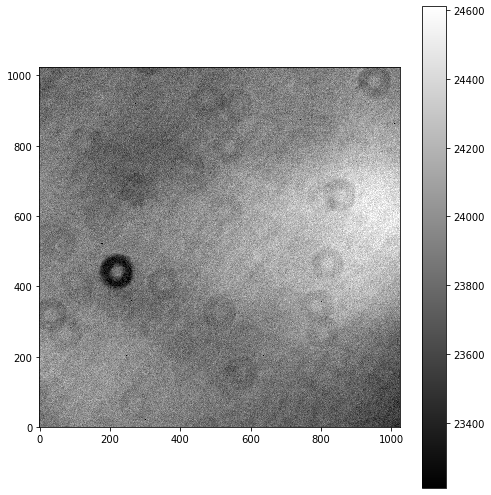

In [22]:
filters = ["Bessel B", "Bessel V", "Bessel R"]
mflats = {}


for filt in filters:
    flats = images.filter(imagetyp = "Flat Field", filter = filt)
    print(flats)
    red_flats = []
    
    for flat in flats.ccds(ccd_kwargs = {"unit":"adu"}):
        flat = ccdp.subtract_bias(flat, mbias)
        flat = ccdp.subtract_dark(flat, mdark, scale=True, exposure_unit = u.s, exposure_time = 'exptime')
        red_flats.append(flat)
    
    filt_string = filt.replace(" ", "_")
    fname = filt_string + "flat.fit"
    
    mflat = ccdp.combine(red_flats, method='median')
    mflat.write("reduced/mflats.fit", overwrite = True)
    mflats[filt] = mflat.copy()

mflatsimage = CCDData.read("reduced/mflats.fit")
ap.showimage(mflatsimage)

6. Reduce the data

Grab a list of all of the imagetyp="Light Frame".

Iterate over the Light Frame ccds.

Use the all-in-one *ccdp.ccd_process* on the ccd with *master_bias=mbias*, *dark_frame=mdark*, *master_flat=mflats[ccd.header["Filter"]]* ,*dark_scale=True, exposure_unit=u.s, exposure_key='exptime' *

Write out the reduced ccd to the reduced data directory
```
lights = ccdp.filter( ... )

for light in lights.ccds():
    light = ccdp.ccd_process( ...)
    light.write( ...)
```

ImageFileCollection(location='', keywords=['simple', 'bitpix', 'naxis', 'naxis1', 'naxis2', 'bscale', 'bzero', 'date-obs', 'exptime', 'exposure', 'set-temp', 'ccd-temp', 'xpixsz', 'ypixsz', 'xbinning', 'ybinning', 'xorgsubf', 'yorgsubf', 'readoutm', 'filter', 'imagetyp', 'focuspos', 'focustem', 'object', 'objctra', 'objctdec', 'objctalt', 'objctaz', 'objctha', 'sitelat', 'sitelong', 'jd', 'jd-helio', 'airmass', 'focallen', 'aptdia', 'aptarea', 'swcreate', 'sbstdver', 'telescop', 'instrume', 'observer', 'notes', 'flipstat', 'swowner', 'tilexy'], filenames=['/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/61-Cyg-001B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/61-Cyg-001R.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/61-Cyg-001V.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/ASASN_20lb-001B.fit', '/home/idies/workspace/Temporary/fzohrabi/scratch/20200909/ASASN_20lb-001R.fit', '/home/idies/workspace/Temporary/fzohrabi/scr

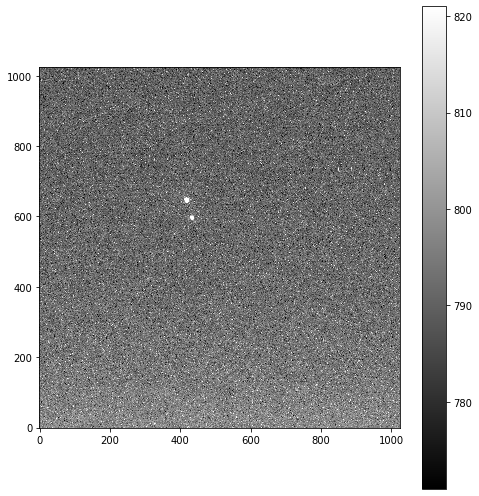

4.5930218319579 5.8390459095483935
-18.453751050826536 32.881694965446385


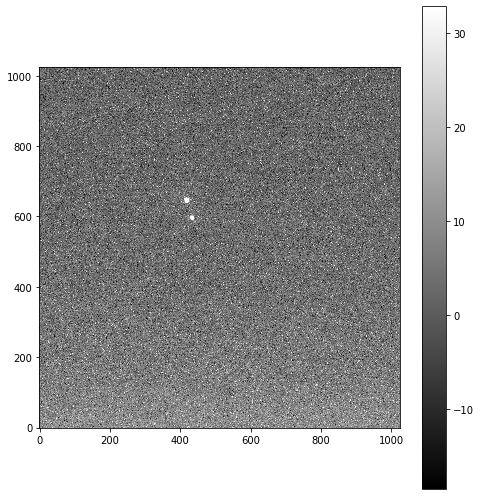

strd= 5.839054646872055
61-Cyg-001R.fit
794.0213890075684 5.9304
769 824.9359265651304


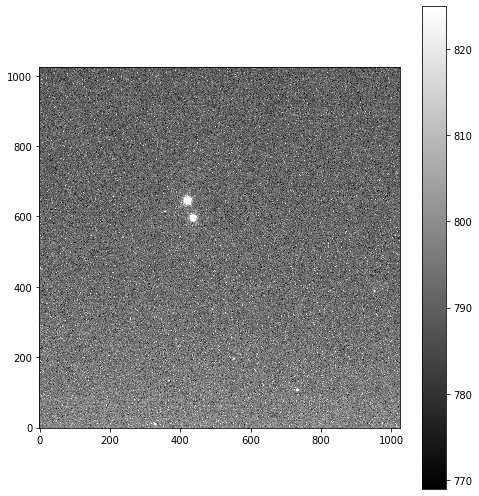

6.010211793241315 5.931888970239139
-18.70114493661293 37.970197963336844


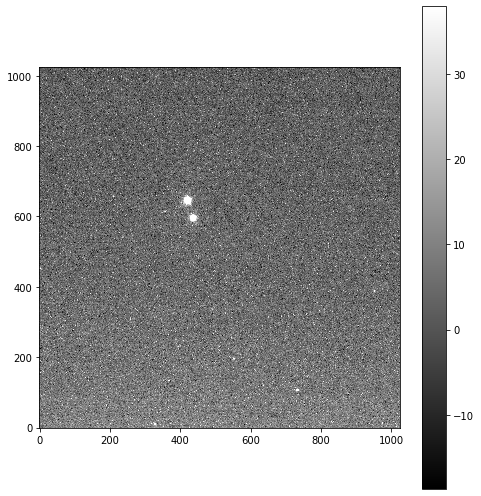

strd= 5.931897846489584
61-Cyg-001V.fit
792.9828100204468 5.9304
767 824.8894020719067


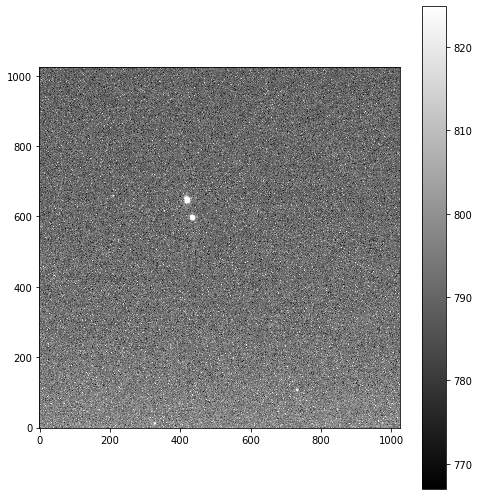

4.97158504974417 5.889355572891267
-22.63991300348392 39.27870981936724


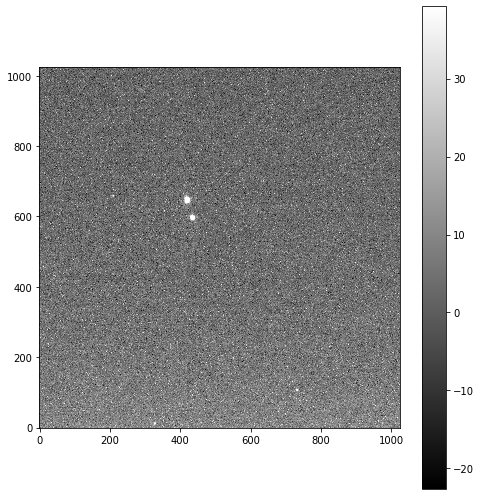

strd= 5.889364385496374
ASASN_20lb-001B.fit
905.3574047088623 10.3782
868 963.2905912564794


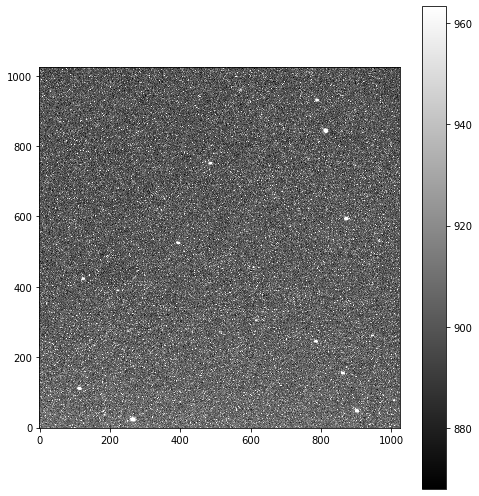

106.57865913659188 9.037713927855963
71.78254129670499 143.97872557596867


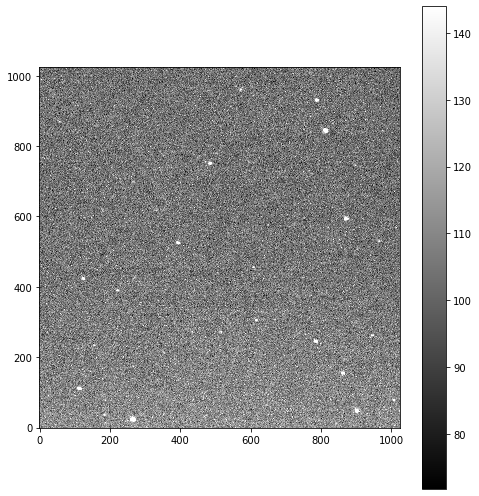

strd= 9.03772745154339
ASASN_20lb-001R.fit
1166.5858612060547 14.825999999999999
1122 1247.7347278107923


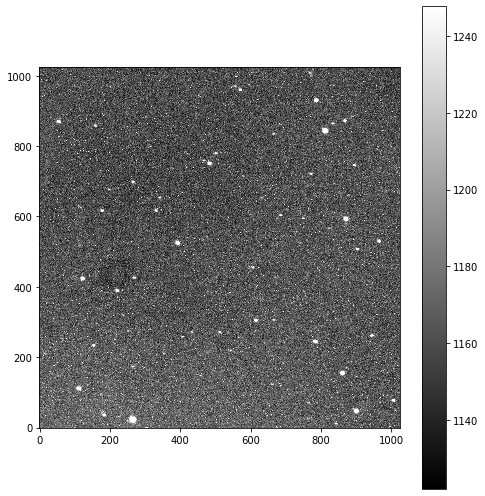

367.81941774884586 13.704703213928175
329.38551090708097 412.75650627069643


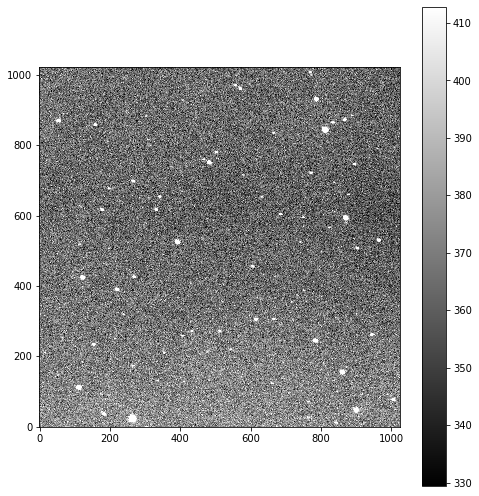

strd= 13.704723721118823
ASASN_20lb-001V.fit
1069.9102516174316 13.343399999999999
1034 1145.7813605930485


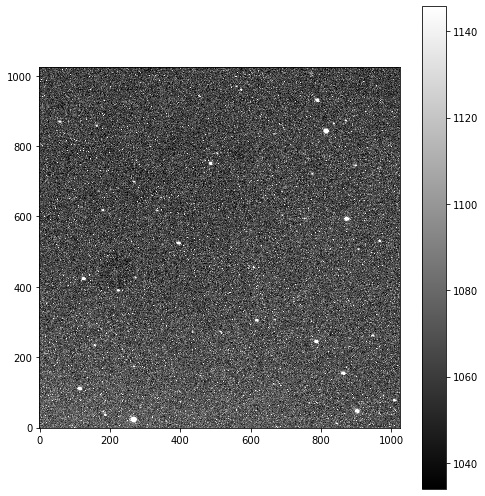

271.1391531248211 11.873787118555562
232.1236618667056 315.77325957933994


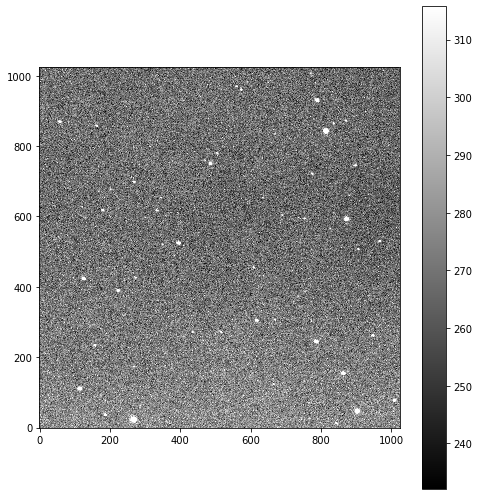

strd= 11.873804886033803
ASASN_20lb_001V.fit
1069.5945072174072 13.343399999999999
1032 1142.8578948808506


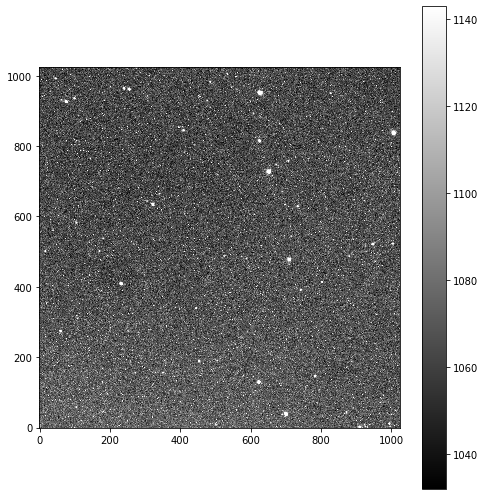

270.82367149909766 11.944936328213688
234.08044116953306 340.68666090093524


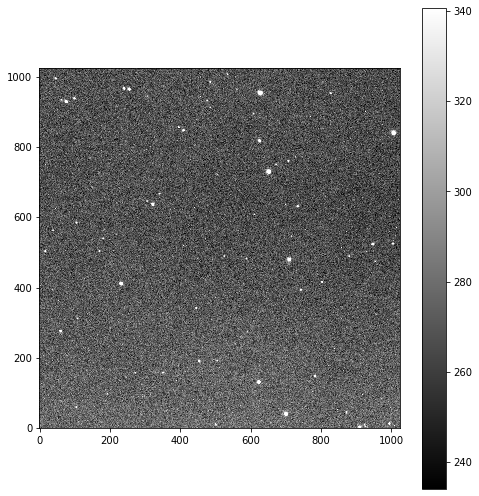

strd= 11.94495420215687
ASASN_20lb_002V.fit
1072.2753601074219 13.343399999999999
1024 1149.943284909859


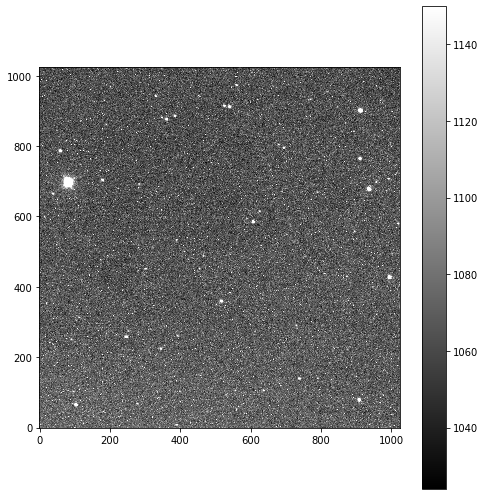

273.50873439365466 11.8919671820315
228.71496259268505 347.36837779716825


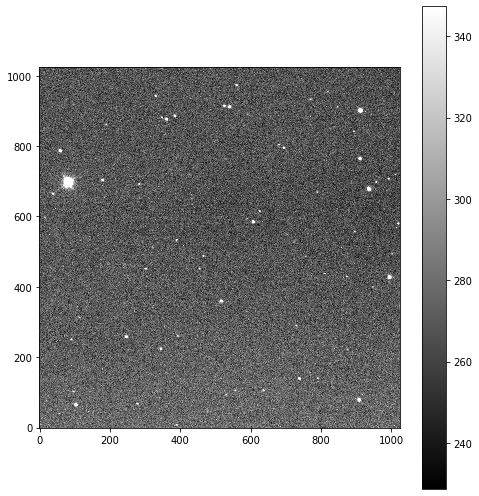

strd= 11.891984976713688
ASASN_20lb_003V.fit
1069.3067302703857 13.343399999999999
1027 1144.180552276596


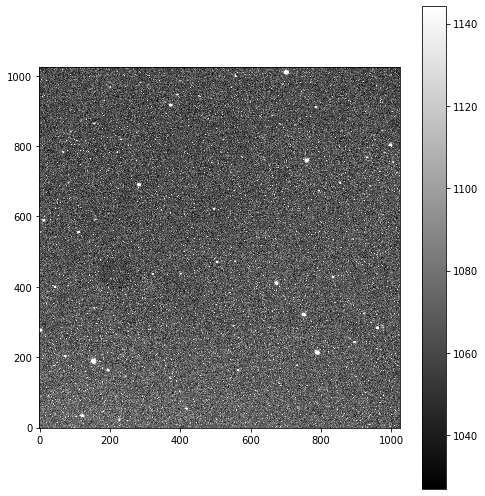

270.53452324123157 11.84988271085772
231.61679960345245 313.5727690678773


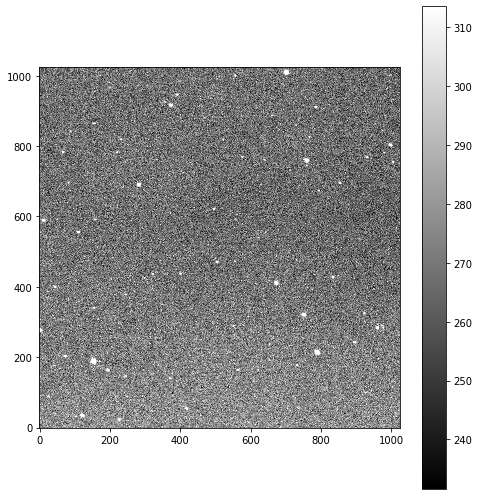

strd= 11.849900442566327
ASASN_20lb_004V.fit
1071.635127067566 13.343399999999999
1032 1142.091716287449


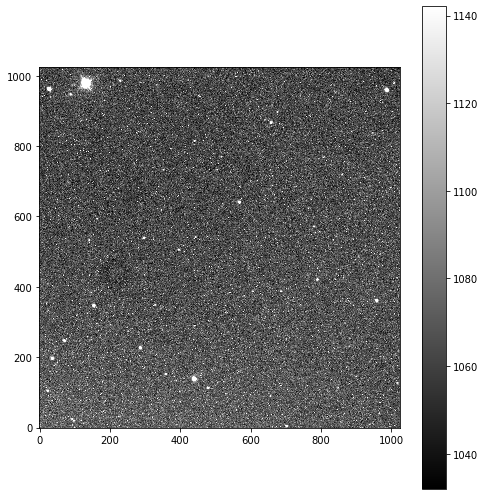

272.87879723910225 11.904834289558243
236.1394583062884 337.7453625311121


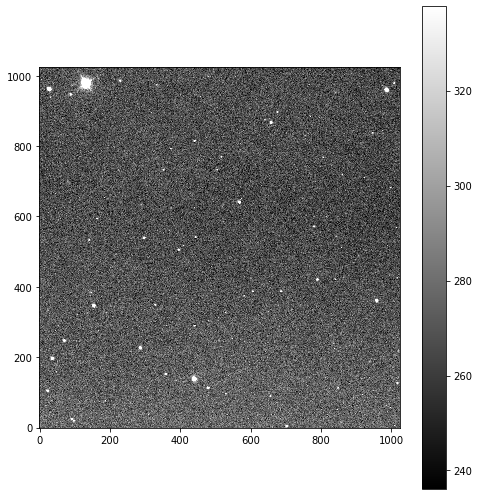

strd= 11.904852103494278
ASASN_20lb_005V.fit
1067.7170581817627 13.343399999999999
1024 1142.829381136475


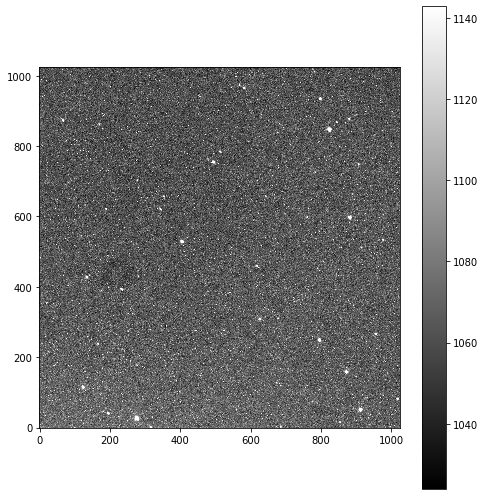

268.9456518127851 11.815597797759374
230.78902623173687 338.0217919705525


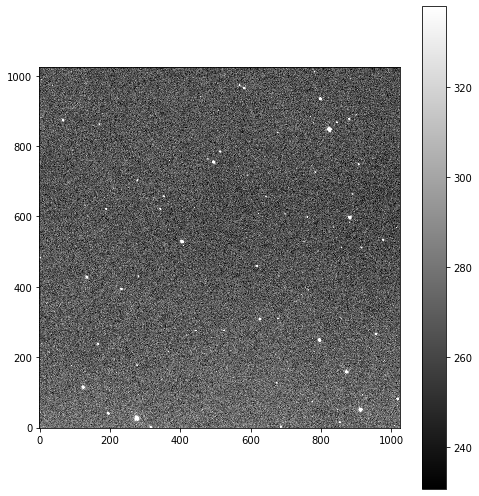

strd= 11.815615478165354
ASASN_20lb_006V.fit
1069.6614418029785 13.343399999999999
1028 1143.6665695345491


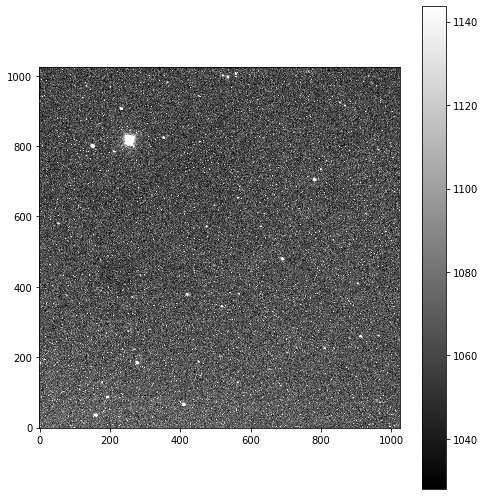

270.91090138421106 11.791045564773714
227.5548536782637 337.62644501520595


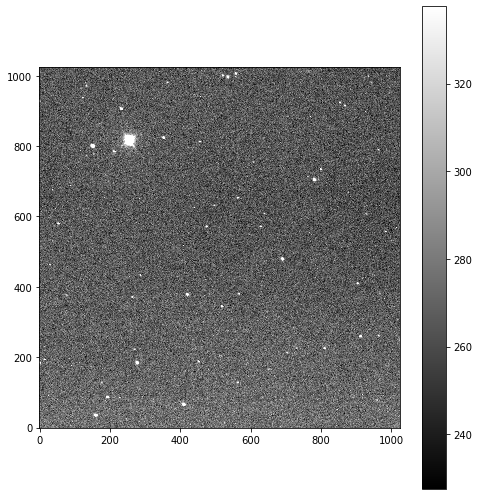

strd= 11.791063208440677
ASASN_20lb_007V.fit
1067.3328866958618 13.343399999999999
1021 1143.9461423161306


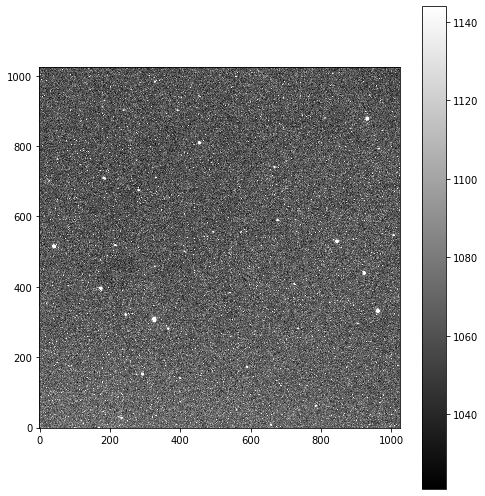

268.56024408141315 11.816244430656335
230.91633186097005 340.2471581589343


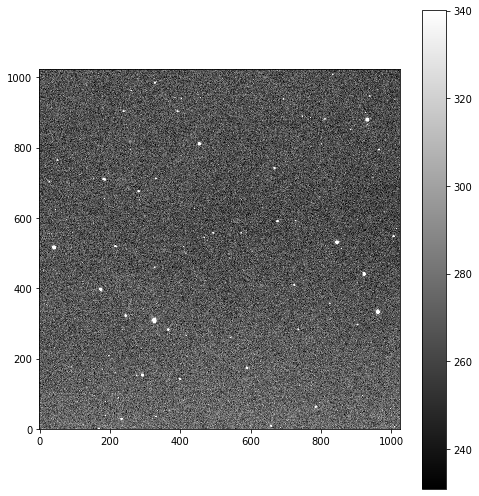

strd= 11.816262112029913
ASASN_20lb_008V.fit
1069.6280794143677 13.343399999999999
1017 1142.2750044094971


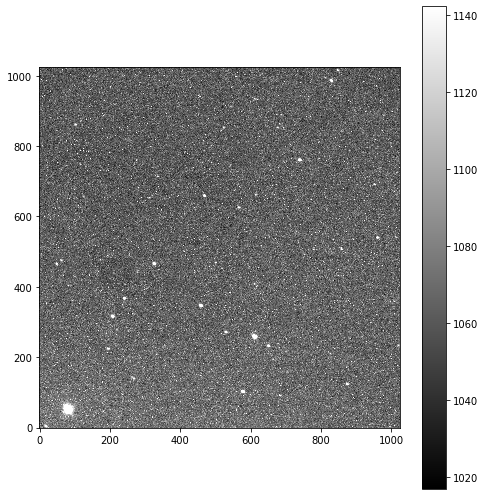

270.85047882418445 11.844913562847697
225.4988829853988 339.68956848988455


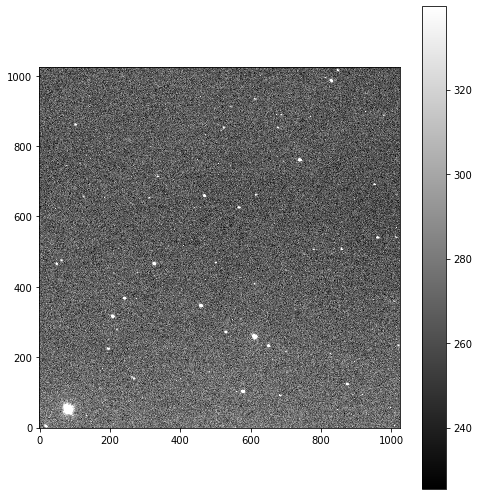

strd= 11.84493128712066
BL-Lac-001B.fit
919.3227119445801 10.3782
887 979.7662921569869


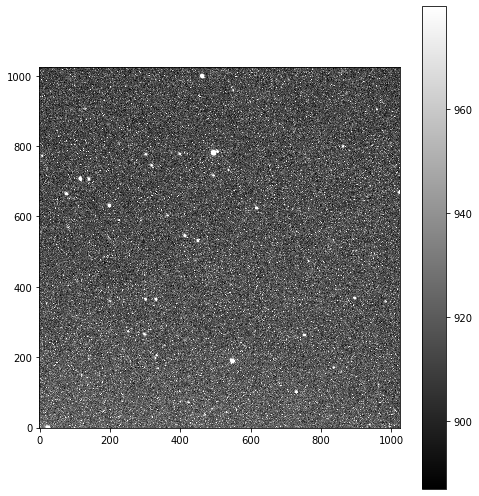

120.54583463511187 9.068722947839325
90.31725983063517 177.0933755995713


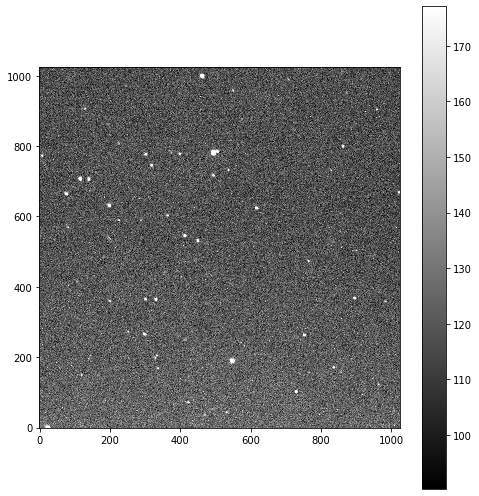

strd= 9.068736517927457
BL-Lac-001R.fit
1198.680669784546 14.825999999999999
1147 1286.3205108538234


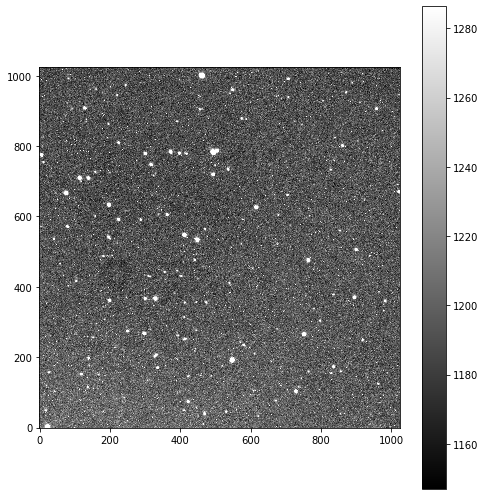

399.9211383633108 14.209774581034758
349.4757143880821 485.58274895860444


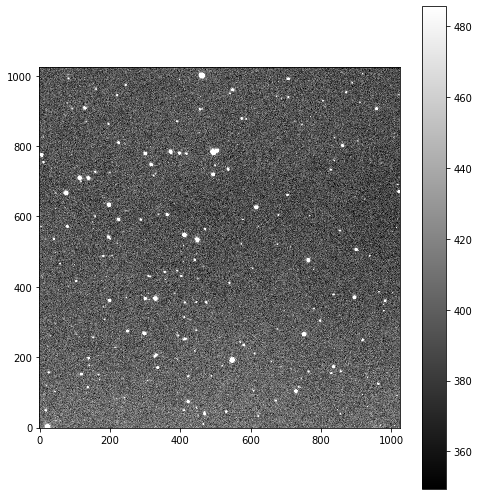

strd= 14.209795843994769
BL-Lac-001V.fit
1103.849458694458 13.343399999999999
1062 1183.172967245287


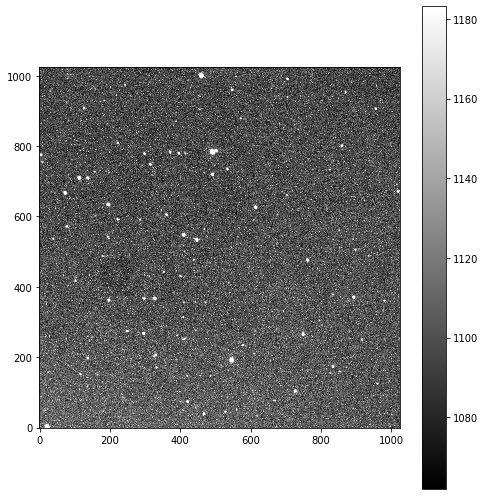

305.0835007309312 12.584812736960611
266.099433017646 375.7328834101708


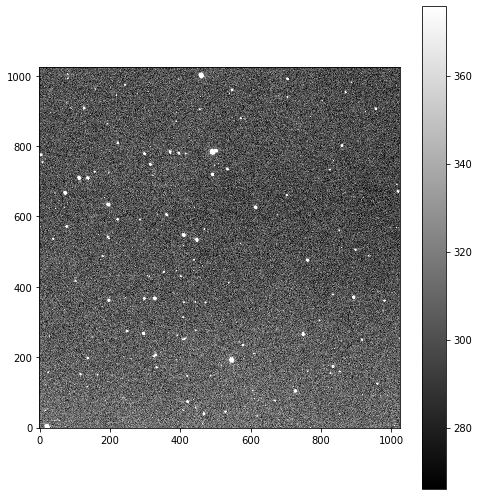

strd= 12.584831568390234
HH_And-001V.fit
1067.0521545410156 11.8608
1031 1139.3288117154543


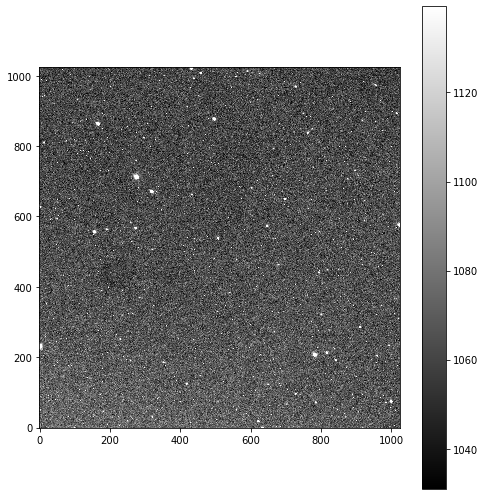

271.8874101937372 11.843518836112057
235.34277510176153 340.623363891982


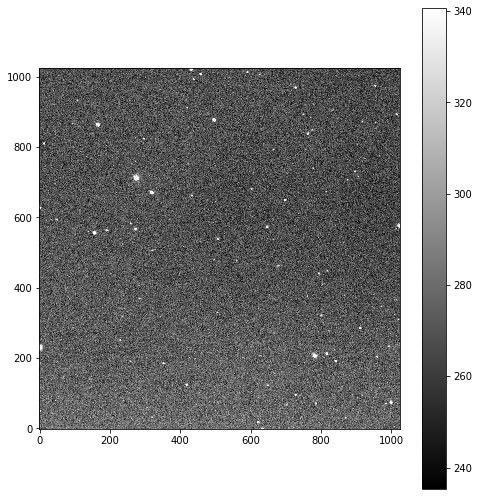

strd= 11.843536558298005
Krug-60-001V.fit
929.071231842041 8.8956
899 983.59727398376


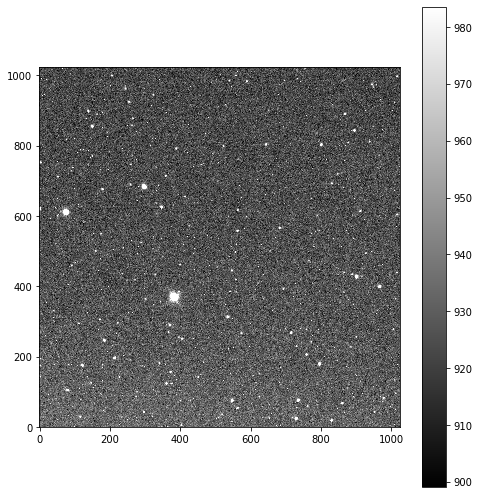

137.50703193733068 9.363474619829553
108.5446170036991 190.19388970827043


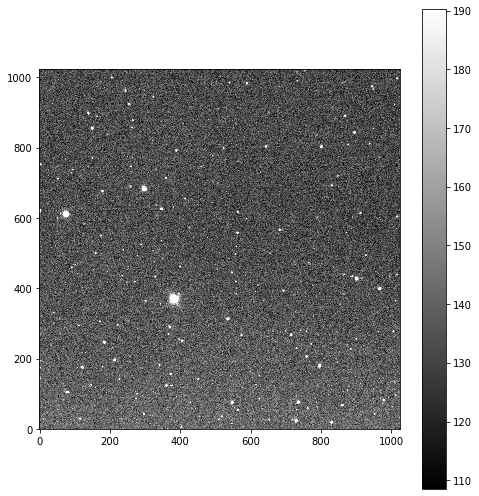

strd= 9.363488630972748
Krug-60-002V.fit
928.1869602203369 8.8956
893 982.2057143290028


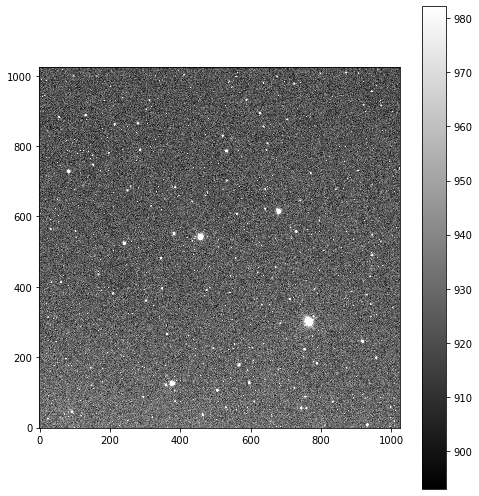

136.6098229835977 9.343314341498319
101.01431373157061 191.1869779007598


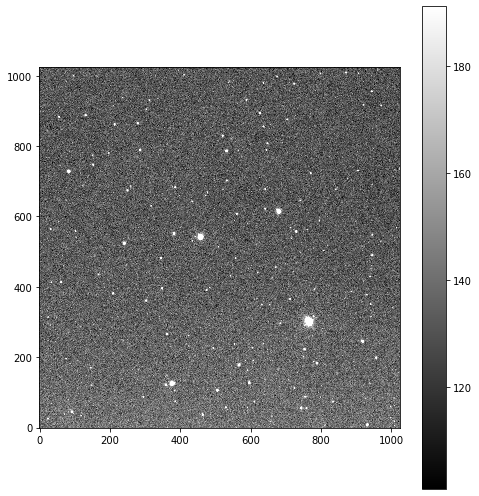

strd= 9.343328322474447
M4-001B.fit
898.3122415542603 10.3782
860 958.642148784031


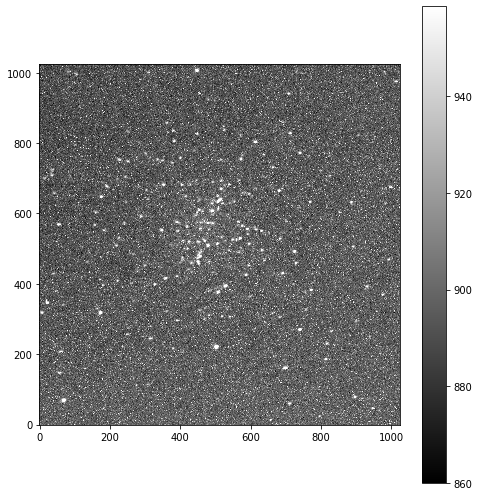

99.52889774168838 9.027015473691646
64.71850827035642 154.62895700431636


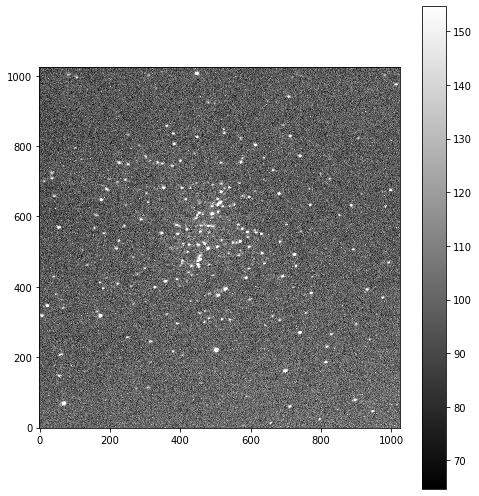

strd= 9.027028981370318
M4-001R.fit
1279.5962858200073 19.273799999999998
1218 1388.8755951181668


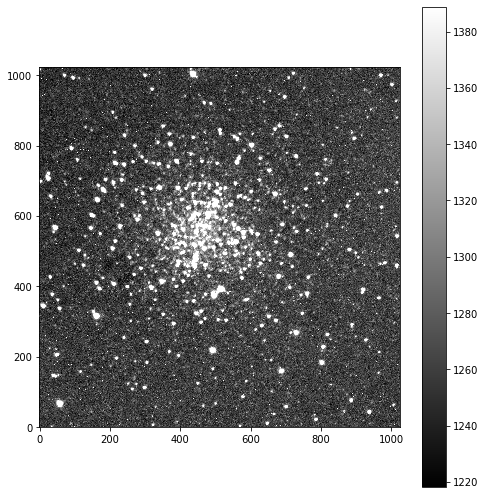

480.8092053958915 17.746199969927886
419.663291888787 582.0928141154615


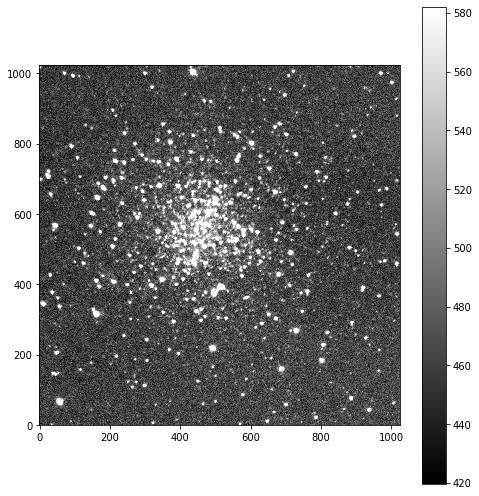

strd= 17.7462265246588
M4-001V.fit
1092.525800704956 14.825999999999999
1043 1173.9980003900093


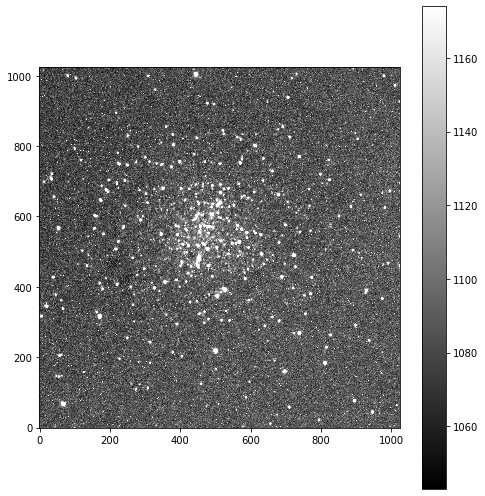

293.74284777191076 13.01889642955715
247.92606553115382 369.14952744774394


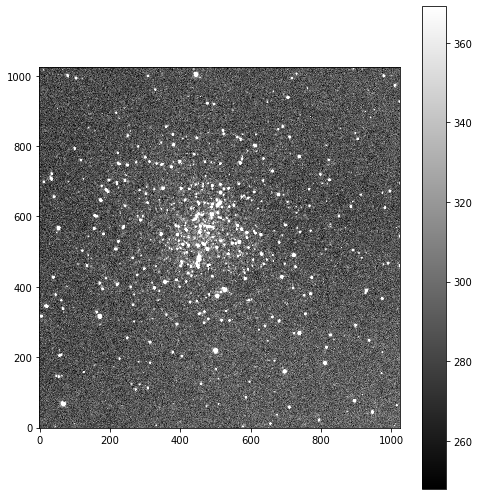

strd= 13.018915910532911


In [44]:
#lights = ccdp.filter(object = 'Light Frame', naxis1=1024)
lights = images.filter(imagetyp = "Light Frame", naxis1=1024)
print(lights)

for light,fname in lights.ccds(ccd_kwargs = {"unit":"adu"}, return_fname = True):
    print(fname)
    light = ccdp.ccd_process(light, master_bias=mbias, dark_frame=mdark, master_flat=mflat, dark_scale=True, exposure_unit=u.s, exposure_key='exptime')
    light.write("reduced/" + fname, overwrite = True)
    
    mlightimage = CCDData.read("reduced/" + fname)
    
    image_raw= CCDData.read(fname,unit="adu")
    ap.showimage(image_raw)
    ap.showimage(mlightimage)
    strd_im = ccdp.sigma_func(light,  axis=None)
    
    print ("strd=",strd_im)
